בס"ד

ב"ה

## **M8 Assignment: K Nearest Neighbors and Support Vector Machines**

Ben Besthof, Tal Benhamou, Daniel Malinsky

## 1) Introduction

Acquiring customers comes at an expense, but offering current ones additional services can return additional profit. Increasing product breadth can be a risk for insurance companies because new customers might not be interested in how many products the firm offers; rather new customers might care more about the depth of the homeowner's policy. So how can insurance companies profit off suplemental policies?

One way to achive this goal is by offering current customers additions to their current homewner's insurance policy. However, offering a full spectrum of products to a tenured customer may overwhelm them. Some customers know what they want while other's don't. Insurance companies can employ the use of data analytics and predictive modeling to help personalize product offerings to tenured customers to increase profit.

The goal of this assignment is to analyze insurance customer data and use k nearest neighbors and support vector machines classifier to correctly predict the probability of a customer buying an additional policy. The preformance opf each model with different feature sets will be compared to a logistic regression model to see which set of predictors best explain the variance in the data.



## 2) Exploratory Data Analysis

We will create a function that processes the data for the logistic regression models after reviewing variables and their values.

In [9]:
#importing required packages
!pip install ydata_profiling
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import ydata_profiling
from ydata_profiling import ProfileReport
import sklearn
import sklearn.preprocessing as pre
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, confusion_matrix
# Cross-validation utilittes to optimize modeL performance
from sklearn.model_selection import KFold, cross_val_score
import scipy as sp
import statsmodels.api as sm
# Ignoring warnings
# Import the warnings Library
import warnings
# Ignore warnings to keep the notebook clean
warnings.filterwarnings("ignore")

#loading data into pandas
df = pd.read_csv('M7_Data.csv')
df.head()
#return first rows of the dataset

,TARGET,loyalty,ID,age,city,LOR,prod_A,type_A,type_B,prod_B,turnover_A,turnover_B,contract,age_P,lor_M
0,Y,99,77,66,2,0,0,0,0,0,333.561114,264.721010,2,66,3
1,Y,1,159,45,2,3,1,3,3,1,394.735699,284.904978,2,45,39
2,Y,1,220,42,2,2,1,3,6,1,342.180990,1175.589721,2,42,27
3,Y,99,303,31,2,0,0,0,0,0,453.757916,242.341754,2,31,3
4,Y,99,306,62,2,0,0,0,0,0,384.577469,287.008370,2,62,3


There is some cleaning and transformation required for this dataset. Especially in the target variable the values should be changed from Y or N to 1 or 0 because, in this case, the model will not be able to plot points on a value scale of Y to N. However, for the purpose of exploring the data, transforming values will not be necessary and will be done before modeling


**Exploring data quality**

In [ ]:
#checking the dimensions, data types, and null counts of the data
def basics(df):
  """
  getting basic information of dataset
  args:
    df: dataset to be analyzed
  Returns:
    sum of null values in data set along with dimensions and and data types
  """
  data_types = df.info()
  return data_types

basics(df)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14016 entries, 0 to 14015
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   TARGET      14016 non-null  object 
 1   loyalty     14016 non-null  int64  
 2   ID          14016 non-null  int64  
 3   age         14016 non-null  int64  
 4   city        14016 non-null  int64  
 5   LOR         14016 non-null  int64  
 6   prod_A      14016 non-null  int64  
 7   type_A      14016 non-null  int64  
 8   type_B      14016 non-null  int64  
 9   prod_B      14016 non-null  int64  
 10  turnover_A  14016 non-null  float64
 11  turnover_B  14016 non-null  float64
 12  contract    14016 non-null  int64  
 13  age_P       14016 non-null  int64  
 14  lor_M       14016 non-null  int64  
dtypes: float64(2), int64(12), object(1)
memory usage: 1.6+ MB


All but three fetaures are read as discrete numerical values. The target is read as an object because the values are strings. Several variables might have binary values or even categorical information.

In [ ]:
# Assuming you have a pandas DataFrame named 'df'
profile = ProfileReport(df, title='Pandas Profiling Report', explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 3) Data Preparation

**Checking outliers**

One must be careful when dealing with outliers in the data set especially with the intention for fitting a knn classifier because it uses a distance formula. Therefore, outliers can skew data interpretation simply because they are "further" away from the other records. Outliers can be more easily discovered with a scatterplot.


Let's explore the relationship between length of relationship in months with turnover on product A

<Axes: xlabel='lor_M', ylabel='turnover_A'>

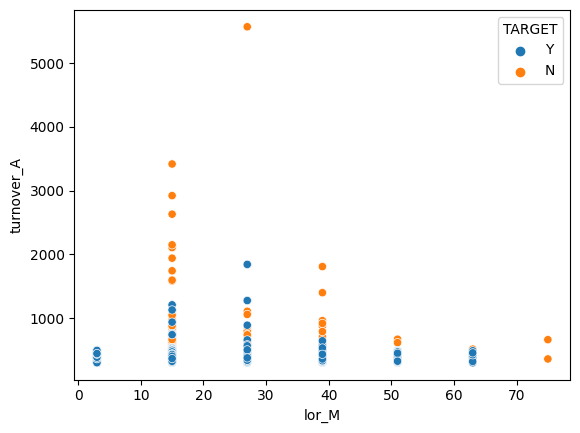

In [ ]:
sns.scatterplot(data = df, x = 'lor_M', y = 'turnover_A', hue = 'TARGET')


-Most customers that buy an additional prodcut are generating relatively lower turnovers on product A than customers who solely buy product A as their only policy.

-There is a considerable distance between all the instances and the event of a turnover greater than $5,000. Removing that/those record/s can improve model performance by reducing the calculated distance between records that are similar.



**Exploring target variable**

Using basic pre processing function to enhance analysis of target variable. The function removes duplicates and drops unnecessary features such as ID. The excluded features do not contribute informational value.

In [ ]:
def dapp(df, target):
  """
  Removing unnecessary features and dropping duplicates

  Args:
    df: dataset to be analyzed
    target(str): column name of target variable


  Returns:
     duplicates dropped, and unecessary variables are dropped as well
"""
  #gathering categorical variables:
  categories = ['prod_A', 'prod_B', 'type_A', 'type_B', 'city', 'loyalty']
  df[categories].astype(str)
  numerical_variables = list(df.select_dtypes(exclude = object))

  #gathering variables with zero variance
  no_var = []
  for i in numerical_variables:
      if df[i].std() == 0.0:
          no_var.append(i)

  numerical_variables = list(set(numerical_variables) - set(no_var) - set(df[target]))

#dropping unnecessary features

  df.drop(no_var, axis = 1, inplace = True)

  numerical_variables = [i for i in numerical_variables if i not in categories]
  df = df.drop_duplicates()
  df.drop('ID', axis = 1, inplace = True)
  df['turnover_A'] = round(df['turnover_A'],2)
  df['turnover_B'] = round(df['turnover_B'],2)

  return df

# creating a copy of the df to monitor change in target variable distribution after applying function
df_copy = dapp(df.copy(), 'TARGET')

<ipython-input-4-313b2e303780>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('ID', axis = 1, inplace = True)
<ipython-input-4-313b2e303780>:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['turnover_A'] = round(df['turnover_A'],2)
<ipython-input-4-313b2e303780>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

Basic preprocessing removes features with no variance (standard deviation = 0.0) like 'contract', which only had a single value across all instances. Furthermore the ID feature was removed because has high cardinality and its used as a unique identifier. ID or customer ID has no informational relevance with tens of thousands of distinct values.

In [ ]:
df_copy.head()

,TARGET,loyalty,age,city,LOR,prod_A,type_A,type_B,prod_B,turnover_A,turnover_B,age_P,lor_M
0,Y,99,66,2,0,0,0,0,0,333.56,264.72,66,3
1,Y,1,45,2,3,1,3,3,1,394.74,284.90,45,39
2,Y,1,42,2,2,1,3,6,1,342.18,1175.59,42,27
3,Y,99,31,2,0,0,0,0,0,453.76,242.34,31,3
4,Y,99,62,2,0,0,0,0,0,384.58,287.01,62,3


Matplotlib's histogram can plot how many customers purchased addistional insurance to their current homeowner's policy. This will visualize the balance between outcomes of Yes and No

Axes(0.125,0.11;0.775x0.77) 
 VALUE COUNTS 
 N    8000
Y    6016
Name: TARGET, dtype: int64


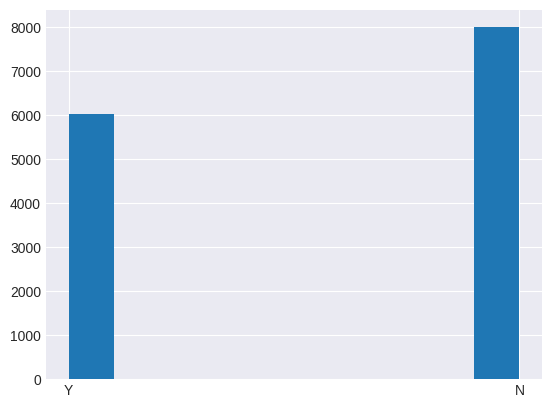

In [ ]:
#creating a histogram with motplotlib object
target_distribution = df['TARGET'].hist()
#creating object that displays the value counts although for our case the distribution might be a whole number
value_cnt = df['TARGET'].value_counts()

print(target_distribution, '\n', 'VALUE COUNTS', '\n', value_cnt)

There is an unbalanced target variable, however a ~6:8 ratio from postiive to negative outcomes does not seem too severe. A consideration also needs to be made about balancing the target variable so that the model can better predict the rarer instances. Fuethermore, the target distribution needs to be observed after removing the duplicate records. Maybe doing so can even out the distribution!



Axes(0.125,0.11;0.775x0.77) 
 VALUE COUNTS 
 N    8000
Y    3008
Name: TARGET, dtype: int64


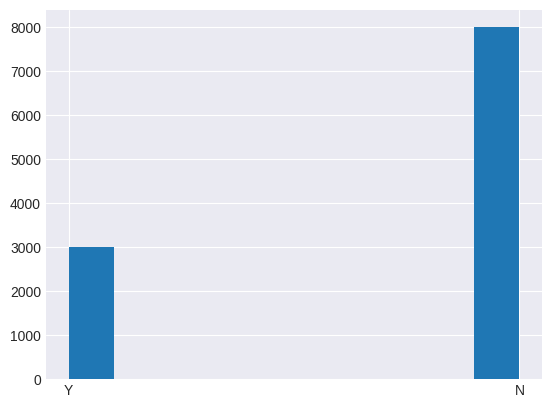

In [ ]:
#creating a histogram with motplotlib object
target_distribution = df_copy['TARGET'].hist()
#creating object that displays the value counts although for our case the distribution might be a whole number
value_cnt = df_copy['TARGET'].value_counts()

print(target_distribution, '\n', 'VALUE COUNTS', '\n', value_cnt)



A little more than half of the positive instances are removed after dropping duplicate records. Observing how the distribution of the target changes across the predictor variables. Balancing the target variable should improve correctly predicting the probability of a customer bundling a service with their current home insurance.

**Checking the distribution of values with units in years before and after dropping duplicates**

orange = Y

blue = N

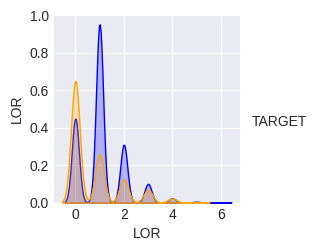

In [ ]:

select_categories = ['LOR', 'TARGET']
#creating scatter plots and histograms of given set of features highlighting the distribution of target across plotted varaibles
custom_palette = {'Y' : "orange", 'N' : "blue"}

sns.pairplot(df[select_categories], hue = 'TARGET', palette = custom_palette)


The amount of "Y" instances decreases greatly in relationships less than a year after droping duplicates

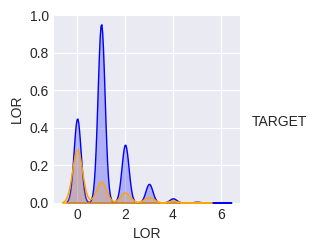

In [ ]:
# plot after dropping duplicates
sns.pairplot(df_copy[select_categories], hue='TARGET', palette = custom_palette)

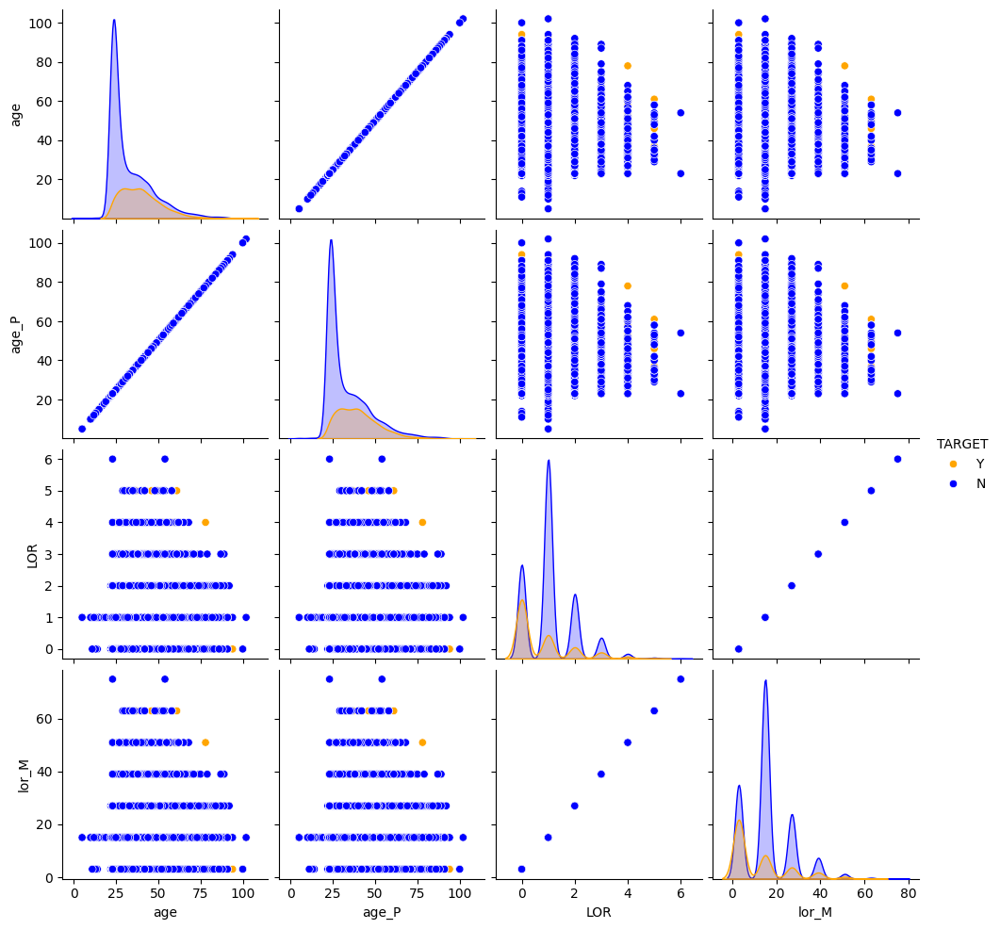

In [ ]:
#creating scatter plots and histograms of given set of features highlighting the distribution of target across plotted varaibles
ages = ['age', 'age_P', 'LOR', 'lor_M', 'TARGET']
custom_palette = {"N" : "blue", "Y" : "orange"}
sns.pairplot(df_copy[ages], hue = 'TARGET', palette = custom_palette)

The removal of duplicates de-intensifies the concentration of positive outcomes within certain age groups. However, the highest concentration of positive instances are not in relationships or in a relationship less than one year. It seems that positive instances increase as the length of relationship decreases. The highest concentration of those who reject additional products are have a relationship a year long. Age and age of partner show high colinearity and the visual highlights informational redundancy. Length of relationship might be considered for removal when deciding our feature set to fit to the model. Length of relationship in months will serve the same informational purpose as length of relationship in years, especially considering that the values will be scaled after preprocessing.

## Loading the data

In [ ]:
#loading data into pandas
df = pd.read_csv('https://raw.githubusercontent.com/Benhamax/DAV-6150---Data-Science/main/M7_Data.csv')
df.head()
#return first rows of the dataset

,TARGET,loyalty,ID,age,city,LOR,prod_A,type_A,type_B,prod_B,turnover_A,turnover_B,contract,age_P,lor_M
0,Y,99,77,66,2,0,0,0,0,0,333.561114,264.721010,2,66,3
1,Y,1,159,45,2,3,1,3,3,1,394.735699,284.904978,2,45,39
2,Y,1,220,42,2,2,1,3,6,1,342.180990,1175.589721,2,42,27
3,Y,99,303,31,2,0,0,0,0,0,453.757916,242.341754,2,31,3
4,Y,99,306,62,2,0,0,0,0,0,384.577469,287.008370,2,62,3


In [ ]:
df_3 = df.copy()

In [ ]:
#summary of the dataset
df_3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14016 entries, 0 to 14015
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   TARGET      14016 non-null  object 
 1   loyalty     14016 non-null  int64  
 2   ID          14016 non-null  int64  
 3   age         14016 non-null  int64  
 4   city        14016 non-null  int64  
 5   LOR         14016 non-null  int64  
 6   prod_A      14016 non-null  int64  
 7   type_A      14016 non-null  int64  
 8   type_B      14016 non-null  int64  
 9   prod_B      14016 non-null  int64  
 10  turnover_A  14016 non-null  float64
 11  turnover_B  14016 non-null  float64
 12  contract    14016 non-null  int64  
 13  age_P       14016 non-null  int64  
 14  lor_M       14016 non-null  int64  
dtypes: float64(2), int64(12), object(1)
memory usage: 1.6+ MB


## Stadardizing all the column names

In [ ]:
import re
# Function to clean and standardize column names
def clean_column_name (col_name) :
    # Convert to Lower case
    col_name = col_name.lower()
    # Replace spaces with underscores
    col_name = col_name.replace(' ', '-')
    # Remove special characters
    col_name = re.sub(r'[^a-zA-Z0-9_]', '', col_name)
    # Remove Leading underscores
    col_name = col_name.lstrip('_')
    return col_name

# Apply the function to every column name
df_3.columns = [clean_column_name(col) for col in df_3.columns]

## Shape of the dataframe

In [ ]:
# shape of the dataframe
df_3.shape

# 4) Prepped Data Review

In [ ]:
# Statistcal summary
df_3.describe()

,loyalty,id,age,city,lor,prod_a,type_a,type_b,prod_b,turnover_a,turnover_b,contract,age_p,lor_m
count,14016.000000,14016.000000,14016.000000,14016.000000,14016.000000,14016.000000,14016.000000,14016.000000,14016.000000,14016.000000,14016.000000,14016.0,14016.000000,14016.000000
mean,50.381778,37672.440068,35.882920,-710.950128,0.926299,0.533818,1.607877,1.918878,0.599458,379.161320,328.628207,2.0,35.882920,14.115582
std,48.471790,44855.639209,12.974634,26702.329184,0.965212,0.498873,1.508991,1.686038,0.490026,92.612207,475.616525,0.0,12.974634,11.582550
min,0.000000,1.000000,5.000000,-999999.000000,0.000000,0.000000,0.000000,0.000000,0.000000,300.095909,191.962852,2.0,5.000000,3.000000
25%,2.000000,6741.500000,25.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.919412,219.406925,2.0,25.000000,3.000000
50%,3.000000,13514.500000,33.000000,2.000000,1.000000,1.000000,3.000000,3.000000,1.000000,367.891493,237.656757,2.0,33.000000,15.000000
75%,99.000000,62738.000000,43.000000,2.000000,1.000000,1.000000,3.000000,3.000000,1.000000,399.744924,264.131538,2.0,43.000000,15.000000
max,99.000000,151811.000000,102.000000,235.000000,6.000000,1.000000,6.000000,9.000000,1.000000,5568.784139,12249.084770,2.0,102.000000,75.000000


In [ ]:
df_3['target'].describe()

count     14016
unique        2
top           N
freq       8000
Name: target, dtype: object

The target variable type need to be change to a boolean.

## Finding null rates

In [ ]:
# finding Null Rate
null_rate = df_3.isna().mean().round(4) * 100
null_rate_df = null_rate.to_frame(name='null_rate (%)')
null_rate_df

,null_rate (%)
target,0.0
loyalty,0.0
id,0.0
age,0.0
city,0.0
lor,0.0
prod_a,0.0
type_a,0.0
type_b,0.0
prod_b,0.0


## Dropping duplicates

In [ ]:
# Check for duplicates
duplicates = df_3.duplicated()

# Check if there are any duplicates
has_duplicates = duplicates.any()

print("Are there any duplicate rows?", has_duplicates)

# If you also want to see the duplicate rows
if has_duplicates:
    print("\nDuplicate rows:")
    print(df_3[duplicates])

Are there any duplicate rows? True

Duplicate rows:
      target  loyalty      id  age  city  lor  prod_a  type_a  type_b  prod_b  \
11008      Y       99      77   66     2    0       0       0       0       0   
11009      Y        1     159   45     2    3       1       3       3       1   
11010      Y        1     220   42     2    2       1       3       6       1   
11011      Y       99     303   31     2    0       0       0       0       0   
11012      Y       99     306   62     2    0       0       0       0       0   
...      ...      ...     ...  ...   ...  ...     ...     ...     ...     ...   
14011      Y       99  151601   30     2    0       0       0       0       0   
14012      Y        1  151634   27     2    2       1       3       3       1   
14013      Y       99  151679   26     2    0       0       0       0       0   
14014      Y        1  151804   75     2    1       1       3       3       1   
14015      Y       99  151811   61     2    0       0    

In [ ]:
# dropping the duplicates:
df_3 = df_3.drop_duplicates()

3008 duplicates dropped.

In [ ]:
# Profiling the data
profile = ProfileReport(df_3, title='Pandas Profiling Report', explorative=True)
profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Dataset statistics:
- The data includes 15 variables, including 1 boolean and 6 categorical and 8 numeric, among 11,008 observations.
- There are no missing values, indicating a dataset with complete information, and no immediate need for a data imputation strategy.


## Alerts:
- The contract variable only contains the value "2".
- The variables age and age_p are strongly correlated.
- The variables lor and lor_m are strongly correlated.
- The variable lor is strongly correlated with the variables type_a, type_b, prod_a, and prod_b.
- The City variable is left-skewed (γ1 = -37.05906869).
- The turnover_b variable is right-skewed (γ1 = 23.34994992), meaning that a large number of data points are concentrated on the left side of the distribution, with the tail extending to the right. In other words, there are more unusually low values than high values.
- The variable lor has 3,690 (33.5%) zeros.


## Consequences:
- The contract variable can be deleted because it does not provide any relevant information about the dataset.
- We can delete the lor variable, knowing that the lor_m variable, which is more precise, exists.
- We can drop the age_p variable because it has the exactly same values as the age variable.
- The id variable can be dropped.
- We will quantify the correlations between highly correlated variables to have more information to determine our choices.
- The variable lor contains almost a third of zeros, which is unusual. We note this and will check if this is linked to anything abnormal.

## Checking if there is a difference between the variables lor and lor_m

In [ ]:
# Comparing 'lor' and 'lor_m' columns for differences
differences = df_3[df_3['lor'] != df_3['lor_m']]

# Counting the number of differences
number_of_differences = len(differences)

# Printing the number of differences
print(f"Number of rows with different values between 'lor' and 'lor_m': {number_of_differences}")

# Optional: Display the rows with differences if you need to examine them
if number_of_differences > 0:
    print("Rows with differences between 'lor' and 'lor_m':")
    print(differences)


Number of rows with different values between 'lor' and 'lor_m': 11008
Rows with differences between 'lor' and 'lor_m':
      target  loyalty     id  age  city  lor  prod_a  type_a  type_b  prod_b  \
0          Y       99     77   66     2    0       0       0       0       0   
1          Y        1    159   45     2    3       1       3       3       1   
2          Y        1    220   42     2    2       1       3       6       1   
3          Y       99    303   31     2    0       0       0       0       0   
4          Y       99    306   62     2    0       0       0       0       0   
...      ...      ...    ...  ...   ...  ...     ...     ...     ...     ...   
11003      N        1  16793   33     2    2       1       3       3       1   
11004      N       99  16794   23     2    0       0       0       0       0   
11005      N        1  16798   23     2    2       1       3       3       1   
11006      N       99  16800   32     2    1       1       3       3       1   
1

## Checkin if there is a difference between the variables age and age_p

In [ ]:
# Comparing 'age' and 'age_p' columns for differences
differences = df_3[df_3['age'] != df_3['age_p']]

# Counting the number of differences
number_of_differences = len(differences)

# Printing the number of differences
print(f"Number of rows with different values between 'age' and 'age_p': {number_of_differences}")

# Optional: Display the rows with differences if you need to examine them
if number_of_differences > 0:
    print("Rows with differences between 'age' and 'age_p':")
    print(differences)

## Dropping the variables 'contract', 'age_p', 'lor' and 'id'

In [ ]:
# dropping the non relevant variable.
df_3.drop(['contract', 'age_p', 'lor', 'id'], axis=1, inplace=True)

## Correlation Matrix

<Axes: >

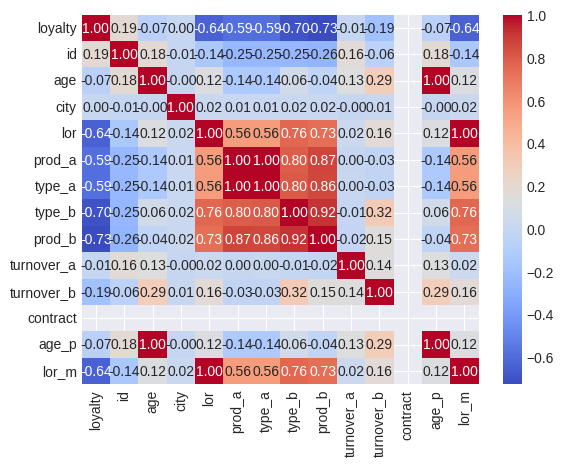

In [ ]:
correlations = df_3.corr()
sns.heatmap(correlations,annot=True, cmap='coolwarm', fmt=".2f" )

We observe hiogh correlation between the variable lor_m and th prod_a, prod_b, type_a and type_b variables but it's normal because the older the relationship with the company the bigger the time window for a customer to buy a product. Therefore those variables will be kept

There is a perfect corrrlation of 1 between the product a and the type of the product a which inquires for a deeper investigation.

Data type of the varaibles need to be changed :

- target - prod_a - prod_b --> boolean
- loyalty - city - type_a - type_b --> object

## Converting the features to the right datatype

### Boolean

In [ ]:
# Convert 'target' from 'Y'/'N' to boolean True/False
df_3['target'] = df_3['target'].map({'Y': True, 'N': False})

# Convert 'prod_a' and 'prod_b' columns from int64 to boolean
df_3['prod_a'] = df_3['prod_a'].astype(bool)
df_3['prod_b'] = df_3['prod_b'].astype(bool)

### Object

In [ ]:
# Convert 'loyalty', 'city', 'type_a', and 'type_b' columns to object (string) type
df_3['loyalty'] = df_3['loyalty'].astype('object')
df_3['city'] = df_3['city'].astype('object')
df_3['type_a'] = df_3['type_a'].astype('object')
df_3['type_b'] = df_3['type_b'].astype('object')

In [ ]:
df_3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11008 entries, 0 to 11007
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   target      11008 non-null  bool   
 1   loyalty     11008 non-null  object 
 2   id          11008 non-null  int64  
 3   age         11008 non-null  int64  
 4   city        11008 non-null  object 
 5   lor         11008 non-null  int64  
 6   prod_a      11008 non-null  bool   
 7   type_a      11008 non-null  object 
 8   type_b      11008 non-null  object 
 9   prod_b      11008 non-null  bool   
 10  turnover_a  11008 non-null  float64
 11  turnover_b  11008 non-null  float64
 12  contract    11008 non-null  int64  
 13  age_p       11008 non-null  int64  
 14  lor_m       11008 non-null  int64  
dtypes: bool(3), float64(2), int64(6), object(4)
memory usage: 1.4+ MB


## Correlation nalysis post transformation

<Axes: >

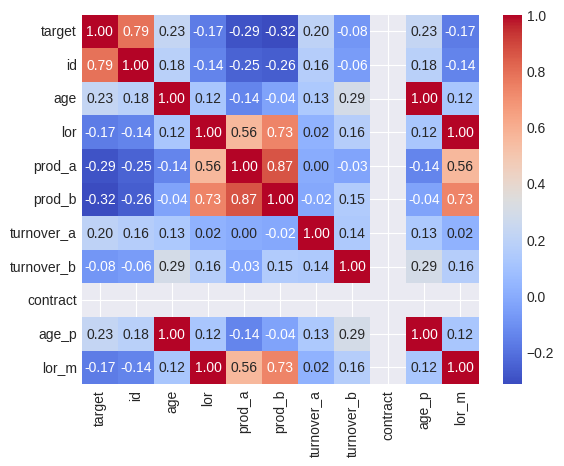

In [ ]:
correlations = df_3.corr()
sns.heatmap(correlations,annot=True, cmap='coolwarm', fmt=".2f")

We still observe a high correlation between prod_a and prod_b variable (0.87).

Also between prod_b and lor_m (0.73).

In [ ]:
# Assuming you have a pandas DataFrame named 'df'
profile = ProfileReport(df_3, title='Pandas Profiling Report', explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Stats on target variable

Matplotlib's histogram can plot how many customers purchased additional insurance to their current homeowner's policy. This will visualize the balance between outcomes of Yes and No

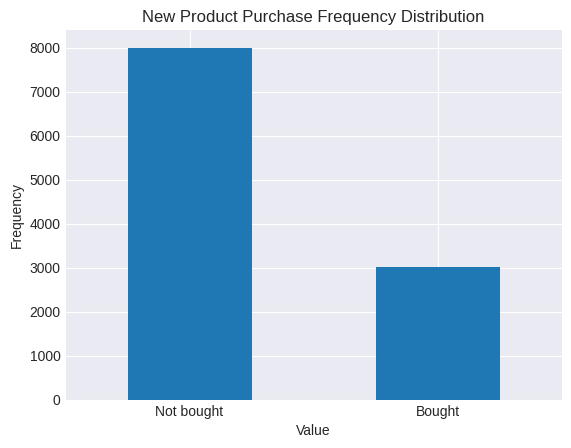

In [ ]:
import matplotlib.pyplot as plt

df_3['target'].value_counts().plot(kind='bar')
plt.title('New Product Purchase Frequency Distribution')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.xticks([1, 0], ['Bought', 'Not bought'], rotation='horizontal')
plt.show()


We observe a significant difference between the "bought" and "not bought" values in the distribution of the target variable. To address this issue, we will balance the data before processing the logistic regression models.

## 5) Regression Modeling : Logistic Regression Modeling

## Model 1

**KNN Classifier and SVM Classifier with basic preprocessing**

The following feature eset with minimal transformation will be used to train the first set of knn and svm models. If the models perform best with this feature set then it will go to show that the models can meaningflly interpret the data without much treatment.

In [ ]:
def dapp(df, target):
  """
  Removing unnecessary features and dropping duplicates

  Args:
    df: dataset to be analyzed
    target(str): column name of target variable


  Returns:
     duplicates dropped, and unecessary variables are dropped as well
"""
  df[target] = df.apply(lambda row: 1 if row[target] == 'Y' else 0, axis=1)
  numerical_variables = list(df.select_dtypes(exclude = object))

  #gathering variables with zero variance
  no_var = []
  for i in numerical_variables:
      if df[i].std() == 0.0:
          no_var.append(i)

  numerical_variables = list(set(numerical_variables) - set(no_var) - set(df[target]))
  categories = ['prod_A', 'prod_B', 'type_A', 'type_B', 'loyalty', 'city']

#dropping unnecessary features

  df.drop(no_var, axis = 1, inplace = True)


  numerical_variables = [i for i in numerical_variables if i not in categories]
  df = df.drop_duplicates()
  df.drop('ID', axis = 1, inplace = True)
  df['turnover_A'] = round(df['turnover_A'],2)
  df['turnover_B'] = round(df['turnover_B'],2)
  return df

# creating a copy of the df to monitor change in target variable distribution after applying function
df_1 = dapp(df.copy(), 'TARGET')

df_1.head()

,TARGET,loyalty,age,city,LOR,prod_A,type_A,type_B,prod_B,turnover_A,turnover_B,age_P,lor_M
0,1,99,66,2,0,0,0,0,0,333.56,264.72,66,3
1,1,1,45,2,3,1,3,3,1,394.74,284.90,45,39
2,1,1,42,2,2,1,3,6,1,342.18,1175.59,42,27
3,1,99,31,2,0,0,0,0,0,453.76,242.34,31,3
4,1,99,62,2,0,0,0,0,0,384.58,287.01,62,3


In [ ]:
#standardizing numerical features that are not binary or categorical
categories = ['prod_A', 'prod_B', 'type_A', 'type_B', 'loyaly', 'city']
numerical_variables = list(df_1.select_dtypes(exclude = object))
numerical_variables = list(set(numerical_variables) - set(df_1['TARGET']))
numerical_variables = [i for i in numerical_variables if i not in categories]
scaled_numerical_variables = [i for i in numerical_variables]
array = df_1[numerical_variables].values
datascaler = pre.MinMaxScaler(feature_range = (0,1))
df_1[scaled_numerical_variables] = pd.DataFrame(datascaler.fit_transform(array), columns = scaled_numerical_variables)
df_1

,TARGET,loyalty,age,city,LOR,prod_A,type_A,type_B,prod_B,turnover_A,turnover_B,age_P,lor_M
0,1.0,1.000000,0.628866,2,0.000000,0,0,0,0,0.006351,0.006035,0.628866,0.000000
1,1.0,0.010101,0.412371,2,0.500000,1,3,3,1,0.017963,0.007708,0.412371,0.500000
2,1.0,0.010101,0.381443,2,0.333333,1,3,6,1,0.007987,0.081581,0.381443,0.333333
3,1.0,1.000000,0.268041,2,0.000000,0,0,0,0,0.029165,0.004178,0.268041,0.000000
4,1.0,1.000000,0.587629,2,0.000000,0,0,0,0,0.016034,0.007883,0.587629,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
11003,0.0,0.010101,0.288660,2,0.333333,1,3,3,1,0.000433,0.003110,0.288660,0.333333
11004,0.0,1.000000,0.185567,2,0.000000,0,0,0,0,0.003069,0.003032,0.185567,0.000000
11005,0.0,0.010101,0.185567,2,0.333333,1,3,3,1,0.016279,0.003708,0.185567,0.333333
11006,0.0,1.000000,0.278351,2,0.166667,1,3,3,1,0.003318,0.002898,0.278351,0.166667


In [ ]:
# 1. Splitting Data
# Splitting the dataset into features (X) and target variable (y)
X = df_1.drop('TARGET', axis=1)  # All Features besides target variable (independent variables)
y = df_1['TARGET']               # Target variable (dependent variable)

# Splitting the data into training and testing sets
# The test set will be 20% of the total dataset, and we set a random state for reproducibility
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 2. Model Training
# Instantiating a logistic regression model with maximum iterations set to 1000 to ensure convergence
log_reg_model = LogisticRegression(max_iter=1000)

# Fitting the logistic regression model on the training data
log_reg_model.fit(X_train, y_train)

# 3. Model Evaluation
# Making predictions on the test data using the trained model
y_pred = log_reg_model.predict(X_test)

# Printing the classification report to evaluate the model's performance
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

         0.0       0.78      0.95      0.85      1601
         1.0       0.66      0.28      0.39       601

    accuracy                           0.76      2202
   macro avg       0.72      0.61      0.62      2202
weighted avg       0.74      0.76      0.73      2202



**Precision**: Precision measures the accuracy of positive predictions made by the model. For class 0 (negative class), the precision is 0.81, which means that out of all the instances predicted as class 0, 81% of them are actually class 0. For class 1 (positive class), the precision is 0.68, indicating that out of all the instances predicted as class 1, 68% of them are actually class 1.

**Recall**: Recall (also known as sensitivity or true positive rate) measures the ability of the model to correctly identify positive instances. For class 0, the recall is 0.93, indicating that the model correctly identifies 93% of all actual class 0 instances. For class 1, the recall is 0.42, meaning that the model only identifies 42% of all actual class 1 instances.

**F1-score**: The F1-score is the harmonic mean of precision and recall. It provides a balance between precision and recall. For class 0, the F1-score is 0.86, while for class 1, it is 0.52.
Support: Support refers to the number of actual occurrences of each class in the test set. For class 0, the support is 1601, and for class 1, it is 601.

**Accuracy:** Accuracy measures the overall correctness of the model across all classes. The accuracy of the model is 0.79, meaning that it correctly predicts the class for 79% of the instances in the test set.

**Macro Avg and Weighted Avg**: These are the averages of precision, recall, and F1-score across all classes. The macro average (unweighted) is 0.74 for precision, 0.67 for recall, and 0.69 for F1-score. The weighted average takes into account the class imbalance and is calculated by weighting each class's score by its support. The weighted average precision, recall, and F1-score are 0.77, 0.79, and 0.77 respectively.


### Model 2

**Preprocessing data and feature selection for alternative feature set**

The following feature set with transformation and variable removal will be used to train the second set of knn and svm models. If the models perform best with this feature set then it will go to show that the models can increase their predictive value by balancing the target variable and excluding variables adding complexity to the data.

The data preprocessor:

**Removes duplicates**


**Converts several discrete numerical variables to categorical**

The features 'prod_A', 'prod_B', 'type_A', 'type_B', 'loyalty', 'city' use integers to label class labels. For example, there are four types of loyalty categories:

0 - lowest

1 - low

2 - high

3 - highest

99 - no loyalty

Therefore, converting these variables to an object will help the model understand their true nature.


**Creates dummy variables**

-Categorical variables with over two distinct values need to be represented as binary for the model to properly interpret their relationship with the target


**Scaled continuous numerical variables**

Since the KNN classifier uses the eudlidean distance formulato calculate distances between data points it is importnat to ensure numerical variables are on the same scale so that a data point's value is not amplified.


**Balance target variable**

Since there is a significant imbalance in target variable class labels then the model will have a higher tendency to classify a new instance as a false negative because the value N is the dominant class in a group of instances.



In [16]:
def preprocessor(df, target):
  """
  Preparing data for model training

  Args:
    df: dataset to be analyzed
    target(str): column name of target variable


  Returns:
    A DataFrame with:
     -target values transformed
     -numerical values standardized
     -balanced target variable distribution
     -unecessary variables dropped
"""
  if target not in df.columns:
    raise ValueError(f"Target variable '{target}' not found in DataFrame.")
  df = df.drop_duplicates()
  df[target] = df.apply(lambda row: 1 if row[target] == 'Y' else 0, axis=1)
  categories = ['prod_A', 'prod_B', 'type_A', 'type_B', 'city', 'loyalty']
  df[categories] = df[categories].astype(object)
  numerical_variables = list(df.select_dtypes(exclude = object))
  numerical_variables = list(set(numerical_variables) - set(df[target]))
  #gathering variables with zero variance
  no_var = []
  for i in numerical_variables:
      if df[i].std() == 0.0:
          no_var.append(i)

  numerical_variables = list(set(numerical_variables) - set(no_var))

  #separating discrete numerical variables, loyalty has only 4 labels and can, therefore, be considered catgorical
  categories = ['prod_A', 'prod_B', 'type_A', 'type_B', 'loyalty', 'city']


#dropping features with zero variance
  df.drop(no_var, axis = 1, inplace = True)
#rounding continous numerical variables to hundredths
  df['turnover_A'] = round(df['turnover_A'],2)
  df['turnover_B'] = round(df['turnover_B'],2)
#drop variables with high cardinality and high colinearity
  df.drop('ID', axis = 1, inplace = True)
  df.drop('age_P', axis = 1, inplace = True)
  df.drop('LOR', axis = 1, inplace = True)

#create dummy variables to represent features for logistic regression model

  dummy_cat_df = pd.get_dummies(df[categories], drop_first = True)
  df = df.drop(categories, axis = 1)
  df = pd.concat([df, dummy_cat_df], axis = 1)

#balancing target variable with oversampling
  def oversampler(df, target):
    oversamp = SMOTE(random_state = 42)
    input_var = list(df.columns)
    input_var.remove(target)
    X, y = oversamp.fit_resample(df[input_var], df[target])
    X = pd.DataFrame(X, columns = input_var)
    y = pd.DataFrame(y, columns = [i for i in df.columns if i == 'TARGET'])
    df = pd.concat([X, y], axis = 1)
    return df

  df = oversampler(df, target)
  numerical_variables = [i for i in numerical_variables]

  #standardizing numerical features that are not binary or categorical
  # MinMax Scaler transforms values into [0,1] scale.
  # Formula: X rescaled = (Xi - Xmin) / (Xmax-Xmin)

  numerical_variables = list(df.select_dtypes(exclude = object))
  numerical_variables = list(set(numerical_variables) - set(df[target]))
  numerical_variables = [i for i in numerical_variables if i not in categories]
  scaled_numerical_variables = [i for i in numerical_variables]
  array = df[numerical_variables].values
  datascaler = pre.MinMaxScaler(feature_range = (0,1))
  df[scaled_numerical_variables] = pd.DataFrame(datascaler.fit_transform(array), columns = scaled_numerical_variables)



  return df

df_2 = preprocessor(df.copy(), 'TARGET')
df_2.head()

,age,turnover_A,turnover_B,lor_M,prod_A_1,prod_B_1,type_A_3,type_A_6,type_B_3,type_B_6,...,city_177,city_178,city_187,city_191,city_197,city_209,city_219,city_229,city_235,TARGET
0,0.628866,0.006351,0.006035,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.412371,0.017963,0.007708,0.500000,1.0,1.0,1.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.381443,0.007987,0.081581,0.333333,1.0,1.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.268041,0.029165,0.004178,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.587629,0.016034,0.007883,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [17]:
#checking the value distribution of the
df_2['TARGET'].value_counts()

1.0    8000
0.0    8000
Name: TARGET, dtype: int64

In [20]:
# 1. Splitting Data
# Splitting the dataset into features (X) and target variable (y)
X = df_2.drop('TARGET', axis=1)  # All Features besides target variable (independent variables)
y = df_2['TARGET']               # Target variable (dependent variable)

# Splitting the data into training and testing sets
# The test set will be 33% of the total dataset, and we set a random state for reproducibility
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

# 2. K Nearest Neighbor Model Training
#Develop a knn model to predict customer buying additional product using k = 5
knn_2 = KNeighborsClassifier(n_neighbors = 5, metric = 'euclidean')
knn_2.fit(X_train,y_train)

y_pred = knn_2.predict(X_test)
#Printing classification report to evaluate k nearest neighbors model performance
labeling = [0, 1]
print(confusion_matrix(y_test, y_pred, labels = labeling))
print(classification_report(y_test,y_pred))
print('ROC AUC: ', roc_auc_score(y_test,knn_2.predict_proba(X_test)[:,1]))

[[2293  406]
 [ 500 2081]]
              precision    recall  f1-score   support

         0.0       0.82      0.85      0.84      2699
         1.0       0.84      0.81      0.82      2581

    accuracy                           0.83      5280
   macro avg       0.83      0.83      0.83      5280
weighted avg       0.83      0.83      0.83      5280

ROC AUC:  0.9064695851448992


array([[2293,  406],
       [ 500, 2081]])

The baseline knn classifier model

**Optimizing KNN Classifier with cross validation**

In [ ]:
max_K = 100
cv_scores = [ ]

for i in range(1,max_K):
    knn = KNeighborsClassifier(n_neighbors = i)
    scores = cross_val_score(knn,X_train,y_train.values.ravel(),cv = 5,scoring = "recall")
    cv_scores.append(scores.mean())

In [ ]:


# 2. Logsitic Regression Model Training
logmodel_2 = LogisticRegression(solver='liblinear')
logmodel_2.fit(X_train,y_train)

# Fitting the logistic regression model on the training data
logmodel_2.fit(X_train, y_train)

# 3. Model Evaluation
# Making predictions on the test data using the trained model
y_pred = logmodel_2.predict(X_test)

# Printing the classification report to evaluate the model's performance
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

         0.0       0.82      0.76      0.79      2699
         1.0       0.77      0.82      0.79      2581

    accuracy                           0.79      5280
   macro avg       0.79      0.79      0.79      5280
weighted avg       0.79      0.79      0.79      5280



The Logistic regression model correctly predicted customers adding a policy to their homeowner's insurance 82% of the time as identified by an 82 recall.A limited feature set with a balanced target variable makes better generalizations in the relationship between predictors and target because it has more positive instances to learn from.

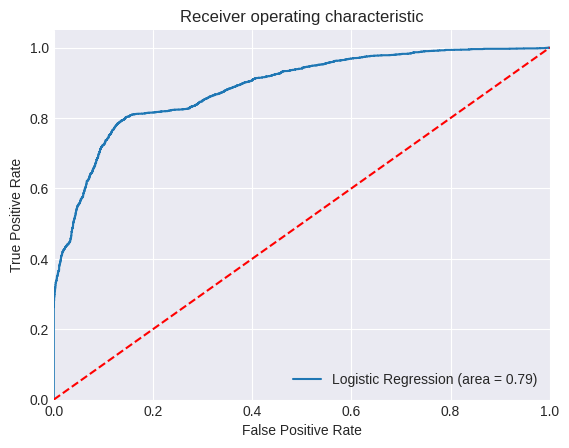

In [ ]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt

logit_roc_auc = roc_auc_score(y_test, logmodel.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, logmodel.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

The model performs considerably better than a human being at making predictions with this data. In other words, it has predictive value. A logistic regression model's predictability of a positive instance increases as one balances the target variable,

## Pre-processing the data for third logistic regression model

For this model, on the dataframe from which we've removed the preceding variables, we are going to balance the dataset and then normalize it.

## Balancing the dataset

In [ ]:
# Separate the majority and minority classes
df_majority = df_3[df_3.target == df_3.target.mode()[0]]
df_minority = df_3[df_3.target != df_3.target.mode()[0]]

# Oversample minority class
df_minority_oversampled = resample(df_minority,
                                   replace=True,     # sample with replacement
                                   n_samples=len(df_majority),     # to match majority class
                                   random_state=123) # reproducible results

# Combine majority class with oversampled minority class
df_balanced = pd.concat([df_majority, df_minority_oversampled])

# Display new class counts
print(df_balanced.target.value_counts())

False    8000
True     8000
Name: target, dtype: int64


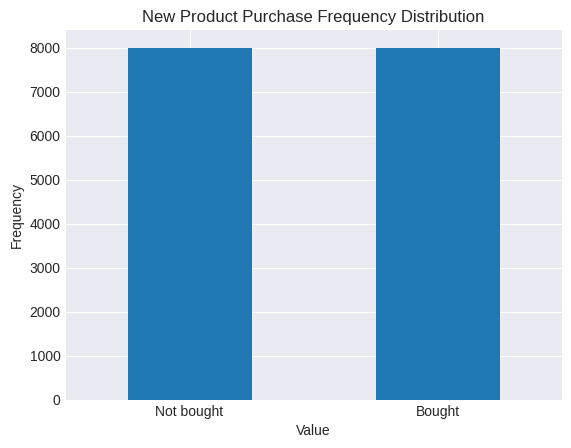

In [ ]:
import matplotlib.pyplot as plt

df_balanced['target'].value_counts().plot(kind='bar')
plt.title('New Product Purchase Frequency Distribution')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.xticks([1, 0], ['Bought', 'Not bought'], rotation='horizontal')
plt.show()


Now we have a dataframe with 16,000 observations and a balanced dataset with respect to the target variable.

## Scaling numerical data

Now the dataframe contains the original data with the numeric columns scaled.

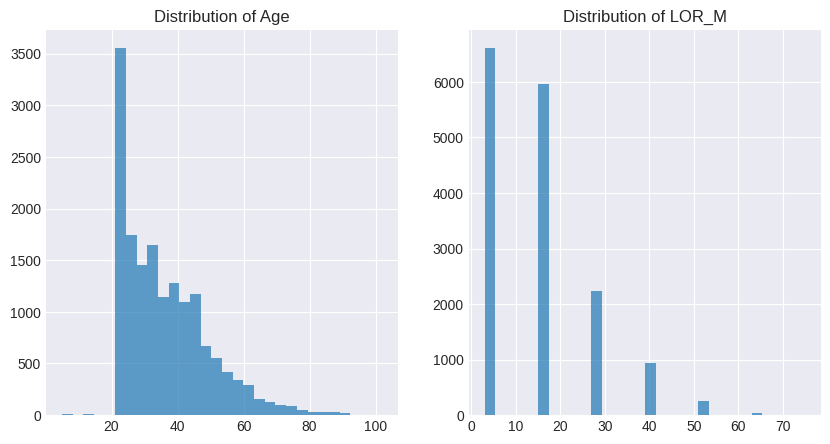

In [ ]:
# Visualization of the distribution of 'age'
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1) # 1 row, 2 columns, 1st chart
plt.hist(df_balanced['age'], bins=30, alpha=0.7)
plt.title('Distribution of Age')

# Visualization of the distribution of 'lor_m'
plt.subplot(1, 2, 2) # 1 row, 2 columns, 2nd chart
plt.hist(df_balanced['lor_m'], bins=30, alpha=0.7)
plt.title('Distribution of LOR_M')

plt.show()

In [ ]:
df_balanced[['age', 'lor_m']].describe()

,age,lor_m
count,16000.000000,16000.000000
mean,36.298750,13.785750
std,12.871086,11.707739
min,5.000000,3.000000
25%,25.000000,3.000000
50%,33.000000,15.000000
75%,44.000000,15.000000
max,102.000000,75.000000


In [ ]:
# Min-max normalization of 'age' and 'lor_m' columns
df_balanced['age_normalized'] = (df_balanced['age'] - df_balanced['age'].min()) / (df_balanced['age'].max() - df_balanced['age'].min())
df_balanced['lor_m_normalized'] = (df_balanced['lor_m'] - df_balanced['lor_m'].min()) / (df_balanced['lor_m'].max() - df_balanced['lor_m'].min())

In [ ]:
df_balanced[['age_normalized', 'lor_m_normalized']].describe()

,age_normalized,lor_m_normalized
count,16000.000000,16000.000000
mean,0.322668,0.149802
std,0.132692,0.162607
min,0.000000,0.000000
25%,0.206186,0.000000
50%,0.288660,0.166667
75%,0.402062,0.166667
max,1.000000,1.000000


The column are well scaled.

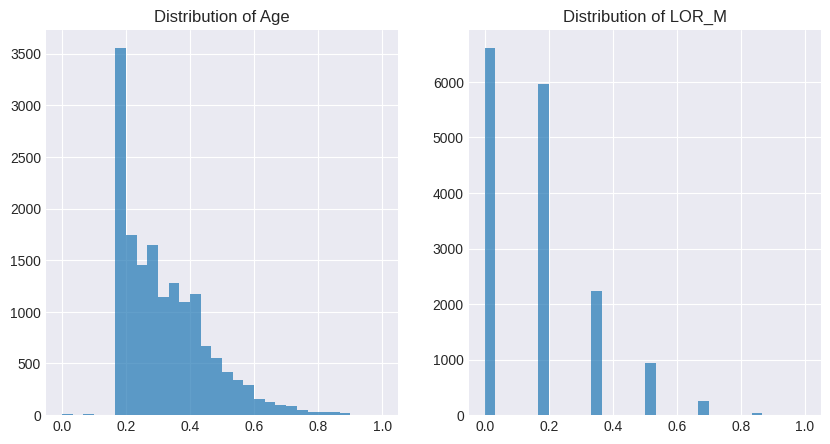

In [ ]:
import matplotlib.pyplot as plt

# Visualisation de la distribution de 'age'
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)  # 1 ligne, 2 colonnes, 1er graphique
plt.hist(df_balanced['age_normalized'], bins=30, alpha=0.7)
plt.title('Distribution of Age')

# Visualisation de la distribution de 'lor_m'
plt.subplot(1, 2, 2)  # 1 ligne, 2 colonnes, 2ème graphique
plt.hist(df_balanced['lor_m_normalized'], bins=30, alpha=0.7)
plt.title('Distribution of LOR_M')

plt.show()

## Third logistic regression model

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

# 1. Splitting Data
# Splitting the dataset into features (X) and target variable (y)
X = df_balanced.drop(['target', 'age', 'lor_m'], axis=1)  # All Features besides target, 'age' and 'lor' variables
y = df_balanced['target'] # Target variable (dependent variable)

# Splitting the data into training and testing sets
# The test set will be 33% of the total dataset, and we set a random state for reproducibility
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

# 2. Model Training
# Instantiating a logistic regression model with maximum iterations set to 1000 to ensure convergence
log_reg_model = LogisticRegression(max_iter = 1000)

# Fitting the logistic regression model on the training data
log_reg_model.fit(X_train, y_train)

# 3. Model Evaluation
# Making predictions on the test data using the trained model
y_pred = log_reg_model.predict(X_test)

# Printing the classification report to evaluate the model's performance
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       False       0.90      0.97      0.94      2654
        True       0.97      0.89      0.93      2626

    accuracy                           0.93      5280
   macro avg       0.94      0.93      0.93      5280
weighted avg       0.94      0.93      0.93      5280




1. **Precision (False)**: For the class labeled 'False' (indicating not buying the product), the precision is 0.72. This means that when the model predicts that a customer will not buy the product, it is correct 72% of the time.

2. **Recall (False)**: The recall for the 'False' class is 0.71. This indicates that the model successfully identifies 71% of the actual non-buyers.

3. **F1-Score (False)**: The F1-score for the 'False' class is also 0.71, suggesting a balance between precision and recall. The F1-score is a harmonic mean of precision and recall, and a score of 0.71 indicates a reasonably good model performance for the 'False' class.

4. **Support (False)**: There were 2654 instances in the test set that were actually 'False' (customers who did not buy the product).

5. **Precision (True)**: For the class labeled 'True' (indicating buying the product), the precision is 0.71. When the model predicts that a customer will buy the product, it is correct 71% of the time.

6. **Recall (True)**: The recall for the 'True' class is 0.71, which means the model correctly identifies 71% of the actual buyers.

7. **Support (True)**: There were 2626 instances in the test set that were actually 'True' (customers who bought the product).

The overall **accuracy** of the model is 0.71, which means that for the entire test set, the model correctly predicts whether a customer will buy the product or not 71% of the time. The **macro average** and **weighted average** scores are also 0.71 for both precision and recall, indicating consistent performance across both classes.

The model shows a balanced performance in distinguishing between the customers who will buy the product and those who will not, with similar precision and recall for both outcomes. It's important to consider the context of the problem when determining if these results are satisfactory. For instance, if the cost of falsely predicting a customer will buy (when they actually do not) is high, you might want more focus on improving precision. Conversely, if missing out on a potential buyer is costly, you might want to improve recall.

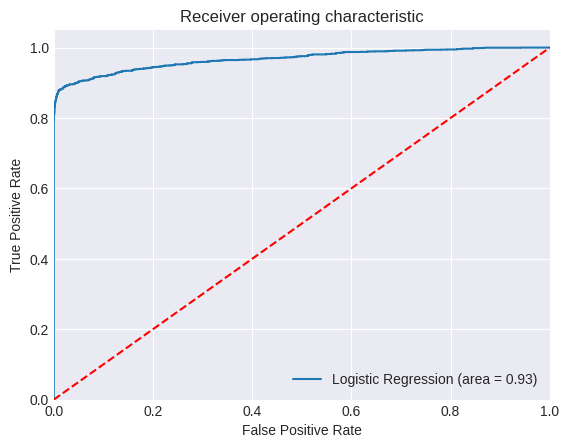

In [ ]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt

# Assuming log_reg_model is your trained Logistic Regression model
# and X_test, y_test are your test datasets

logit_roc_auc = roc_auc_score(y_test, log_reg_model.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, log_reg_model.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()


Overall, an AUC of 0.71 suggests that the model has a good predictive power. However, whether this is acceptable performance depends on the specific business context and the costs associated with false positives and false negatives.
# Conclusion for the third model

The logistic regression model demonstrates a good predictive ability with an ROC-AUC score of 0.71, indicating it can effectively distinguish between potential buyers and non-buyers of a new product. Precision and recall are balanced, both at 0.71, suggesting the model is equally adept at identifying true buyers as it is at avoiding false alarms.

Despite its reasonable accuracy, there's room for improvement, potentially through further model tuning, threshold adjustments, or additional feature engineering. The decision to deploy the model should consider the trade-offs between false positives and negatives in relation to the business's specific costs and goals.

Lastly, while the model is a solid baseline, its performance must be contextualized within the business environment to determine its practical application.

# 6) Select Models

Based on the provided results of the three models, let's compare and contrast their performance:

### Model 1:
- **Precision**: 0.78 for class 0, 0.66 for class 1
- **Recall**: 0.95 for class 0, 0.28 for class 1
- **F1-score**: 0.85 for class 0, 0.39 for class 1
- **Accuracy**: 0.76
- **Macro Avg (Precision/Recall/F1-score)**: 0.72/0.61/0.62
- **Weighted Avg (Precision/Recall/F1-score)**: 0.74/0.76/0.73

### Model 2:
- **Precision**: 0.82 for class 0, 0.77 for class 1
- **Recall**: 0.76 for class 0, 0.82 for class 1
- **F1-score**: 0.79 for both classes
- **Accuracy**: 0.79
- **Macro Avg (Precision/Recall/F1-score)**: 0.79/0.79/0.79
- **Weighted Avg (Precision/Recall/F1-score)**: 0.79/0.79/0.79

### Model 3:
- **Precision**: 0.75 for both classes
- **Recall**: 0.74 for class 0, 0.75 for class 1
- **F1-score**: 0.75 for both classes
- **Accuracy**: 0.75
- **Macro Avg (Precision/Recall/F1-score)**: 0.75/0.75/0.75
- **Weighted Avg (Precision/Recall/F1-score)**: 0.75/0.75/0.75

### Analysis:
- Model 2 performs consistently well across all metrics compared to Model 1 and Model 3.
- Model 1 has relatively high precision for class 0 but low precision for class 1, indicating that it makes more accurate predictions for customers who do not buy the product compared to those who do.
- Model 1 has a high recall for class 0 but low recall for class 1, suggesting that it correctly identifies most customers who do not buy the product but misses many who do.
- Model 3 has balanced precision and recall for both classes but slightly lower performance compared to Model 2.

### Preferred Model:
- I would prefer Model 2 due to its balanced performance across precision, recall, and F1-score for both classes and higher overall accuracy compared to the other models.
- Model 2 also has higher recall for class 1 compared to Model 1, indicating that it can better identify customers who are likely to buy the product, which is crucial for the insurance company's marketing efforts.

### Applying the Preferred Model to the Testing Subset:
- When applying Model 2 to the testing subset, it is expected to maintain its high performance, particularly in terms of accuracy and balanced precision-recall trade-off.
- However, it's essential to validate its performance on unseen data to ensure its generalization capability.
- Further analysis could involve examining any misclassifications to identify patterns or areas for model improvement.

#7) Conclusion

In conclusion, the analysis of the logistic regression models highlights the potential for insurance companies to leverage data analytics and predictive modeling to personalize product offerings to tenured customers, thereby increasing profit through supplemental policies.

Among the three models evaluated, Model 2 emerges as the preferred choice due to its balanced performance across precision, recall, and F1-score for both classes, as well as its higher overall accuracy compared to the other models. This suggests that Model 2 can better identify customers who are likely to buy additional products, which is essential for optimizing marketing efforts and increasing revenue.

Applying Model 2 to the testing subset is expected to maintain its high performance, particularly in terms of accuracy and balanced precision-recall trade-off. However, validation on unseen data is crucial to ensure the model's generalization capability and reliability in real-world scenarios. Further analysis could involve examining any misclassifications to identify patterns or areas for model improvement,